# PRACTICA 9

Julián Mauricio Sánchez Ceballos
1001132830

Departamento de Ingeniería Electrónica y de Telecomunicaciones. 
Universidad de Antioquia.


In [7]:
%pip install numpy -q
%pip install matplotlib -q
%pip install scipy -q
%pip install pandas -q



Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [8]:
import numpy as np 
import matplotlib.pyplot as plt

from scipy.io.wavfile import read, write
from scipy.signal import resample, kaiserord, lfilter, firwin, freqz
from IPython.display import Audio


import warnings
warnings.simplefilter("ignore")

## Diseño de filtros FIR

### 1.1 Procedimiento.

1. Implemente un filtro FIR con las siguientes caracterı́sticas, de acuerdo a su último número de cédula:
    0: **Pasa–banda, fc1=1kHz, fc2=4kHz, fs=16kHz, BW=200Hz, AdB=0**


In [34]:
fc1 = 1000
fc2 = 4000
fs = 16000
BW = 200
AdB = 0

# 1. Normalizan las frecuencias de corte
w1c = 2 * np.pi * fc1 / fs
w2c = 2 * np.pi * fc2 / fs

# 2. Ancho de banda de transición
BWn = 2 * np.pi * BW / fs

# 3. Orden del filtro
M   = int(4/BWn)
n   = np.arange(-M, M+1)

# 4. Respuesta al impulso del filtro ideal pasa-banda
h3 = ((w2c / np.pi) * np.sinc(n * w2c / np.pi)) - ((w1c / np.pi) * np.sinc(n * w1c / np.pi))
h3[n==0]=(w2c-w1c)/np.pi # cuando es pasa-banda

print(f"Filter order: {M}, Bandwidth: {BW} Hz, Cut-off frequencies: {fc_l*fs:.2f} Hz - {fc_h*fs:.2f} Hz")



Filter order: 50, Bandwidth: 200 Hz, Cut-off frequencies: 1000.00 Hz - 4000.00 Hz


2. Grafique la respuesta al impulso del filtro asignado ($h_i$ de acuerdo con la notación usada). ¿Qué puede observar?

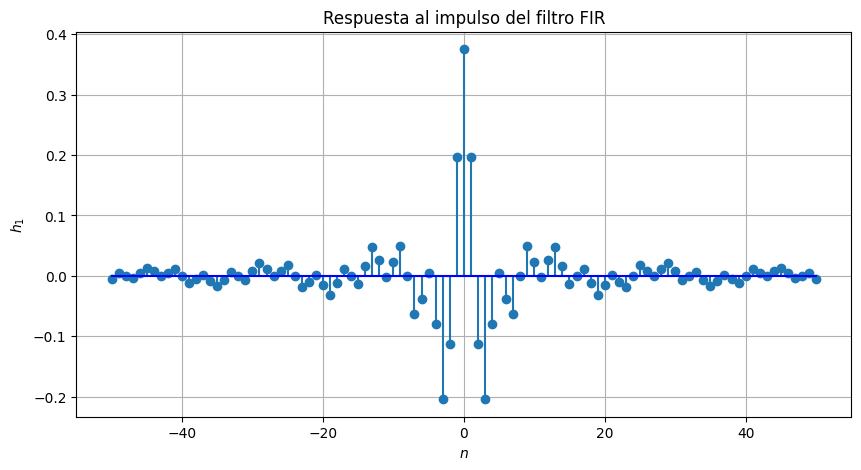

In [35]:
plt.figure(figsize=(10,5))
plt.stem(n,h3,basefmt='b-')
plt.xlabel("$n$")
plt.ylabel("$h_1$")
plt.title("Respuesta al impulso del filtro FIR")
plt.grid()
plt.show()


Dado que el filtro es una composición de senos cardinales, la respuesta del filtro lo es también.


3. Grafique la respuesta al impulso del filtro asignado luego de aplicarle una ventana Hamming. ¿Qué diferencia se puede observar respecto a la anterior gráfica?

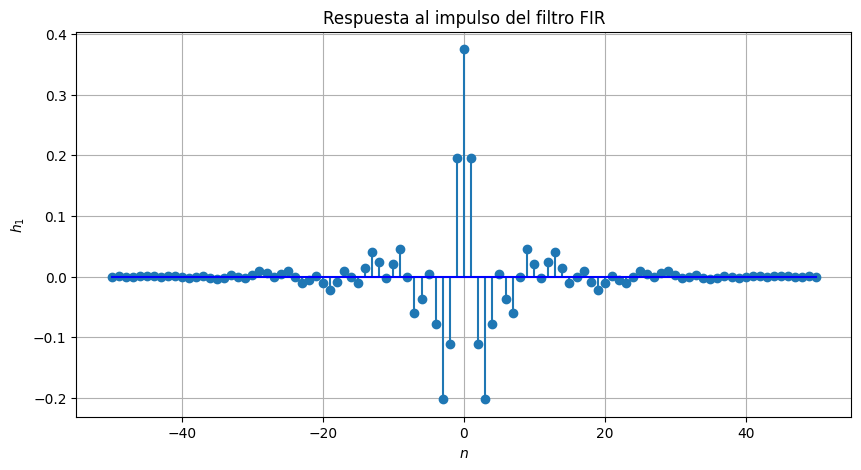

In [36]:
win2 = np.hamming(len(h3))
h3_win=h3*win2 # Multiplico la respuesta ideal por la ventana

%matplotlib inline

plt.figure(figsize=(10,5))
plt.stem(n,h3_win,basefmt='b-')
plt.xlabel("$n$")
plt.ylabel("$h_1$")
plt.title("Respuesta al impulso del filtro FIR")
plt.grid()
plt.show()



Se observa que los puntos al rededor del filtro estan mas atenuados, lo que mejora el control del rizado. 


4. Grafique la respuesta en frecuencia para el filtro asignado sin truncar y el truncado a partir de la ventana Hamming. ¿Qué puede observar?

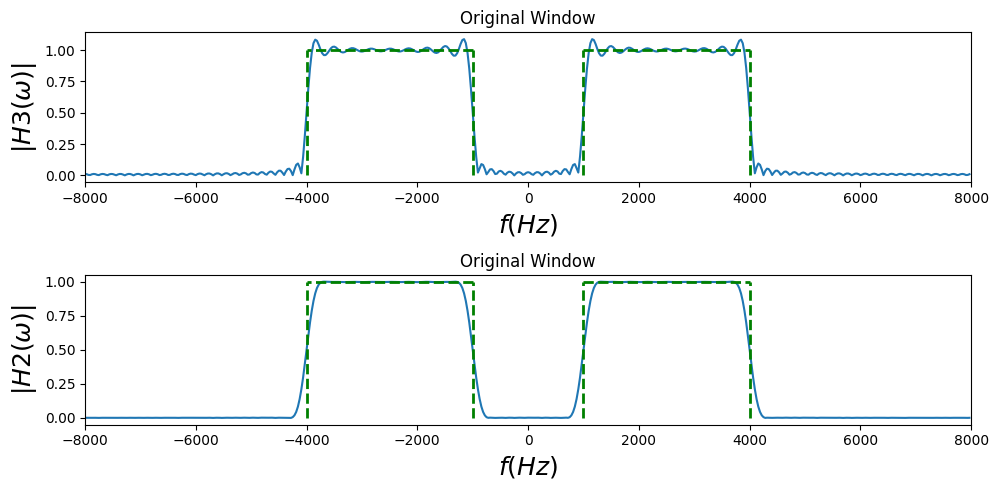

In [39]:
N = 512

w3,Hh3 = freqz(h3,1,whole=True, worN=N) # Respuesta en frecuencia del filtro ideal

A = np.sqrt(10**(0.1*AdB))
h3_win = h3_win*A # Ganancia del filtro
w2,Hh2 = freqz(h3_win,1,whole=True, worN=N) # Respuesta en frecuencia del filtro enventanado

%matplotlib inline

# Plot window and Hamming window
window_to_plot = 643
plt.figure(figsize=(10, 5))
plt.subplot(211)
plt.plot((w3-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh3)))
plt.axis(xmax=fs/2,xmin=-fs/2)
plt.title("Original Window")
plt.vlines([fc1,fc2],0,1,color='g',lw=2.,linestyle='--')
plt.vlines([-fc1,-fc2],0,1,color='g',lw=2.,linestyle='--')
plt.hlines(1,fc1,fc2,color='g',lw=2.,linestyle='--')
plt.hlines(1,-fc1,-fc2,color='g',lw=2.,linestyle='--')
plt.xlabel(r"$f (Hz)$",fontsize=18)
plt.ylabel(r"$|H3(\omega)| $",fontsize=18)

plt.subplot(212)
plt.plot((w2-np.pi)*fs/(2*np.pi),np.abs(np.fft.fftshift(Hh2)))
plt.axis(xmax=fs/2,xmin=-fs/2)
plt.title("Original Window")
plt.vlines([fc1,fc2],0,1,color='g',lw=2.,linestyle='--')
plt.vlines([-fc1,-fc2],0,1,color='g',lw=2.,linestyle='--')
plt.hlines(1,fc1,fc2,color='g',lw=2.,linestyle='--')
plt.hlines(1,-fc1,-fc2,color='g',lw=2.,linestyle='--')
plt.xlabel(r"$f (Hz)$",fontsize=18)
plt.ylabel(r"$|H2(\omega)| $",fontsize=18)

plt.tight_layout()
plt.show()

Se puede observar que el enventanado permite el rizado de la señal, permitiendo un filtrado mas suave de la señal, además en la banda de transición se vuelve mas lenta, lo que la hace también más suave. 


## 2. Filtrado de música con filtros FIR

1. Escriba un programa que grafique la señal correspondiente al último número de su cédula. Recuerde,
normalizar la señal en amplitud, eliminar su nivel DC y crear su vector de tiempo dependiendo de la
frecuencia de muestreo.



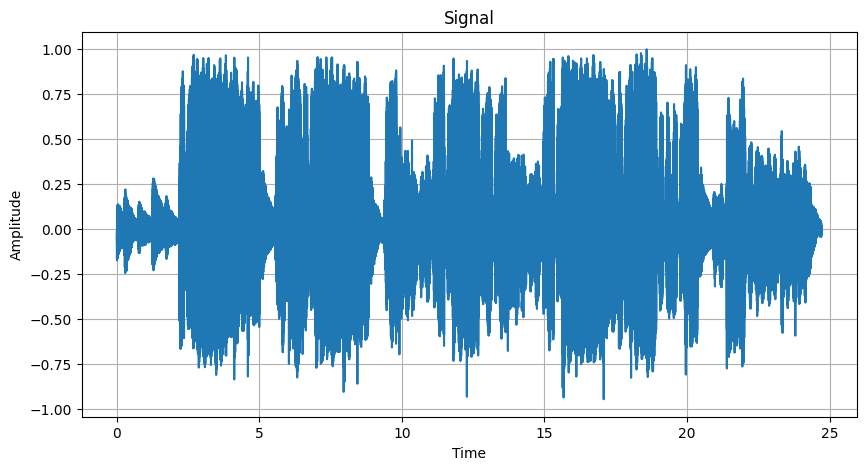

In [42]:
file_audio='audio5.wav' 
fs, signal=read(file_audio)

x = signal/float(np.max(abs(signal)))       # Normalized signal
t = np.arange(0, float(len(x))/fs, 1.0/fs)  # Time vector


plt.figure(figsize=(10,5))
plt.plot(t,x) 
plt.xlabel('Time') 
plt.ylabel('Amplitude')
plt.title('Signal') 
plt.grid() 
plt.show() 

audio = Audio(x, rate=fs)
display(audio) 

2. ¿Qué instrumentos logra escuchar en el audio seleccionado?


Principalmente una flauta y un piano 

3. Diseñe un filtro FIR pasa-bajas con una banda de transición de $200 Hz$, una frecuencia de corte de $600 Hz$ y un ripple de $60 dB$.

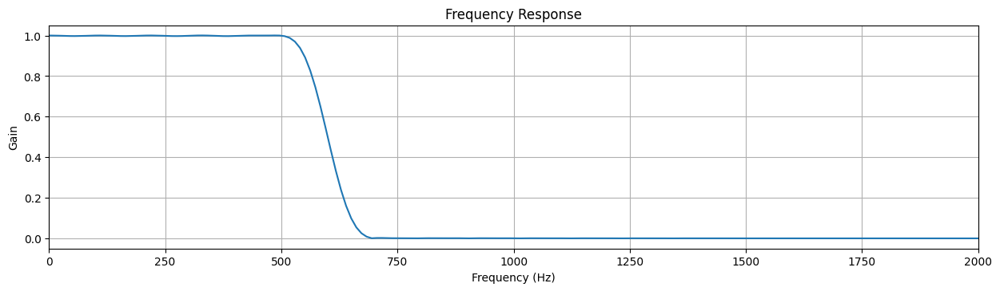

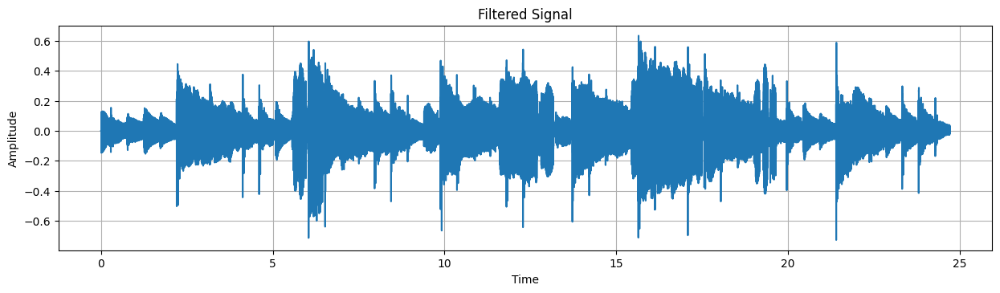

In [56]:
def lowpass(fs, cutoff_hz, lim_x):
    nyq_rate = fs / 2.0
    roll_off = 200.0
    width = roll_off/nyq_rate
    ripple_db = 60.0 #The desired attenuation in the stop band, in dB.

    N, _ = kaiserord(ripple_db, width) # Compute the order and Kaiser param for the FIR filter.
    taps = firwin(N, cutoff_hz/nyq_rate)

    w, h = freqz(taps, worN=2000)

    
    plt.figure(figsize=(15, 8))
    
    plt.subplot(2,1,1)
    plt.plot(nyq_rate*w/np.pi, np.abs(h))
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Gain')
    plt.title('Frequency Response')
    plt.xlim(0, lim_x)
    plt.grid()
    plt.show()

    filtered_x = lfilter(taps, 1.0, x)

    plt.figure(figsize=(15, 8))
    plt.subplot(2,1,2)
    plt.plot(t,filtered_x)
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.title('Filtered Signal')
    plt.grid()
    plt.show()

    audio = Audio(filtered_x, rate=fs)
    display(audio) # para escuchar la senal, si se desea

lowpass(fs, 600.0, 2000)

Aqui se logra apreciar que se eliminaron los sonidos mas agudos o con mayor frecuencia, principalmente generados por la flauta, es la razón que a veces se escucha como si se cortara el sonido de la flauta, además, los sonidos mas graves toman mayor relevancia pues al eliminar los sonidos agudos estos se hacen notar más.

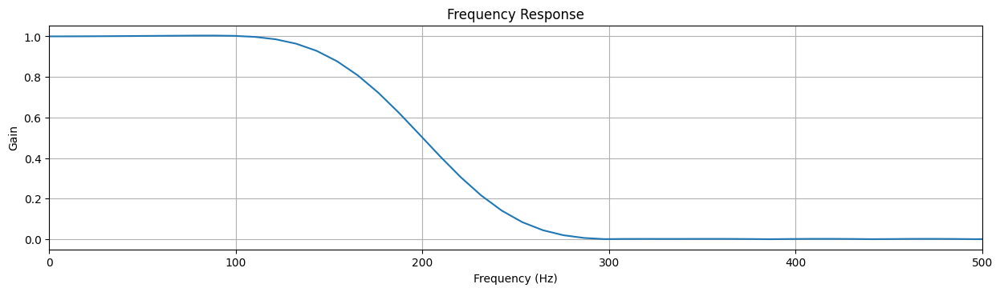

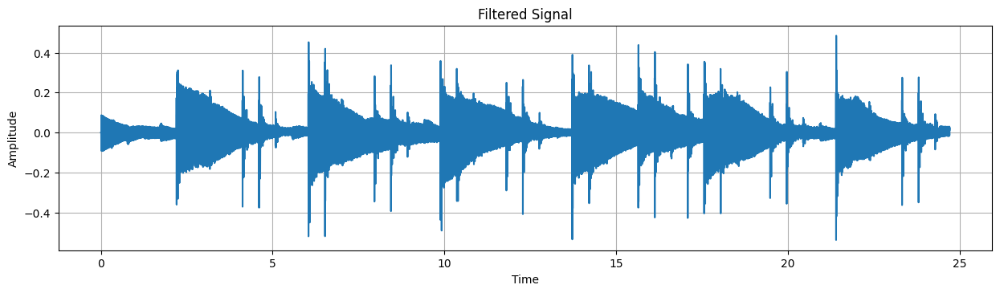

In [57]:
lowpass(fs, 200.0, 500)

Ya no se logra escuchar ni la flauta ni las notas agudas, ahora solo se escucha la base del piano y solo las notas mas graves de la canción, esto debido a que la frecuencia de corte es más baja y por lo tanto, el filtro mas estricto con las frecuencias que deja pasar. 

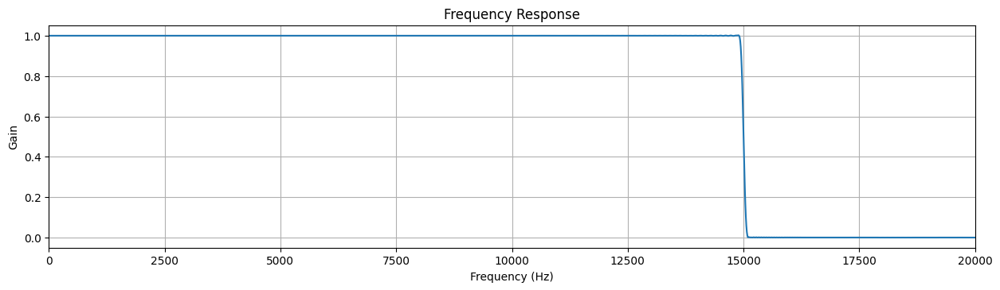

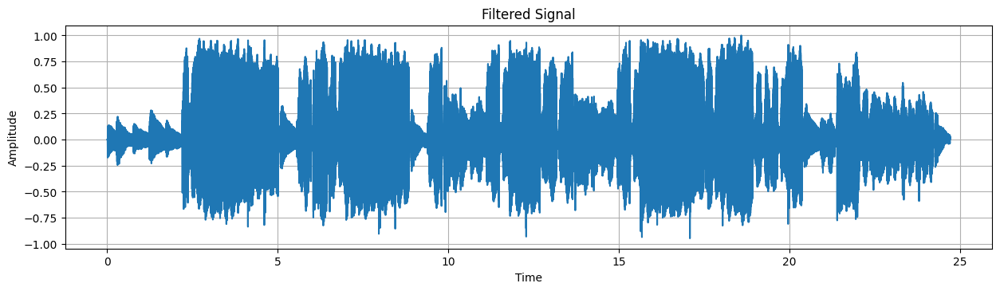

In [58]:
lowpass(fs, 15000.0, 20000)

Para este caso, la frecuencia de corte es tan alta que no se filtra nada, no hay ningún cambio en la señal y se escucha igual que la original.

## Conclusiones. 

* A lo largo del diseño y análisis de filtros FIR, quedó claro que elegir correctamente parámetros como la frecuencia de corte, el orden del filtro y el ancho de banda de transición es fundamental para lograr un buen desempeño. El uso de ventanas como la de Hamming fue especialmente útil para reducir el rizado de Gibbs, mejorando así la respuesta en frecuencia y obteniendo resultados más suaves y precisos en el dominio temporal.

* Al aplicar los filtros diseñados a señales de audio, se pudo observar de forma práctica cómo afectan la separación de componentes de distintas frecuencias. Por ejemplo, los filtros pasa-bajas con frecuencias de corte de 200 Hz y 600 Hz lograron atenuar eficazmente las frecuencias altas, lo que permitió resaltar mejor los instrumentos graves. Esto demuestra que el diseño del filtro tiene un impacto directo en la calidad del audio procesado y en cómo se percibe el resultado final.